In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from helper import padding_with_0, preprocessing_for_cross_valid, read_x_train, fill_nan
from helper import simple_split, dataset_preparation_for_rnn, limit_max_length, rebalance_data, f1_m, standardization

In [3]:
x_train = read_x_train('data/AMF_train_X.csv', includeDay=True, includeShare=True)
y_train = pd.read_csv('data/AMF_train_Y.csv')
name2type = dict(zip(y_train.Trader, y_train.type))
type2ind = {'HFT': 0, 'MIX': 1, 'NON HFT': 2}

In [4]:
x_train_label = x_train['Trader']
x_train = fill_nan(x_train).drop(['Trader'], axis=1)
x_test = read_x_train('data/AMF_test_X.csv', includeShare=True, includeDay=True)
x_test = fill_nan(x_test)
x_train, x_test = standardization(x_train, x_test)

In [5]:
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA

In [17]:
pca = PCA(n_components=16)

In [18]:
pca.fit(x_train)

PCA(n_components=16)

In [19]:
transformed = pca.transform(x_train)
print(pca.explained_variance_ratio_)

[0.2077143  0.09597768 0.07114326 0.06161933 0.06004264 0.05362493
 0.04422524 0.04004644 0.03308766 0.03018644 0.028252   0.02745912
 0.02644559 0.02504052 0.02178971 0.0202902 ]


In [20]:
print(pca.components_)

[[ 4.38158368e-03  1.18591990e-02 -3.00312451e-02  7.49539457e-02
  -2.86069385e-02  1.02834857e-01  2.68955547e-01  1.04030968e-01
   1.53334370e-01  1.03554968e-01  2.12239578e-01  2.41763556e-01
   1.69094645e-01  2.35489769e-01  3.28307626e-01  2.44128192e-01
   3.00790287e-01  2.71419584e-01  2.92339297e-01  2.78260554e-01
   1.94071519e-01 -1.50752853e-01 -8.75304196e-02 -4.80871544e-02
  -1.39946504e-01 -4.66893950e-03 -1.22871381e-02 -1.53561646e-01
  -1.42339910e-03 -1.83009883e-03 -1.50732988e-01  1.62786507e-04
  -3.21372591e-03 -1.47624043e-01 -2.76373948e-03 -4.61791329e-03
  -1.55911533e-01]
 [ 1.32778904e-02 -3.06058360e-03 -3.45996860e-02 -4.39223161e-02
   6.41643268e-02  8.25394794e-02  8.64886961e-02  8.11668675e-02
   7.23525392e-02  6.76666533e-02  1.11084126e-01  1.18431365e-01
   1.53096938e-01  5.20923149e-02  8.08253664e-02  5.68183903e-02
   8.43331228e-02  6.99493932e-02  1.16376542e-01  1.23969490e-01
   2.04082782e-01  2.36464168e-01  2.71134104e-01  4.7960

In [21]:
label_list = [type2ind[name2type[label]] for label in x_train_label]

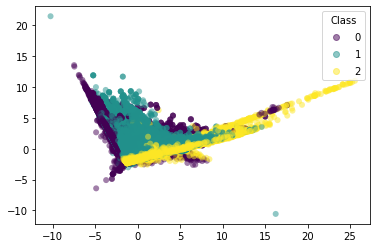

In [22]:
fig, ax = plt.subplots()
scatter = ax.scatter(transformed[:, 0], transformed[:, 1],
            c=label_list, edgecolor='none', alpha=0.5)
ax.legend(*scatter.legend_elements(), loc="upper right", title="Class")

In [23]:
from sklearn.manifold import TSNE

In [24]:
X_embedded = TSNE(n_components=2).fit_transform(transformed)

In [1]:
plt.scatter(X_embedded[:, 0], X_embedded[:, 1],
            c=label_list, edgecolor='none', alpha=0.5)

NameError: name 'plt' is not defined

In [75]:
 from sklearn.manifold import Isomap

In [76]:
embedding = Isomap(n_components=2)

In [77]:
X_transformed = embedding.fit_transform(x_train)

MemoryError: Unable to allocate 83.4 GiB for an array with shape (105782, 105782) and data type float64